<a href="https://colab.research.google.com/github/GabrielaRomoM/SIGNALS-THEORY_2024-1/blob/main/ST_AM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Librerias

In [ ]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl.metadata (5.5 kB)
  Using cached certifi-2024.8.30-py3-none-any.whl.metadata (2.2 kB)
  Using cached mutagen-1.47.0-py3-none-any.whl.metadata (1.7 kB)
  Using cached pycryptodomex-3.20.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.4 kB)
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached urllib3-2.2.3-py3-none-any.whl.metadata (6.5 kB)
  Using cached websockets-13.0.1-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (33 kB)
  Using cach

In [ ]:
!pip install pydub
import subprocess
from pydub import AudioSegment
import yt_dlp as youtube_dl
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch, butter, filtfilt
from IPython.display import Audio

# Funciones

## Descarga Audio Emisora

In [ ]:
# Función para descargar audio de YouTube en formato mp3
def download_ytvid_as_mp3(video_url, name):
    video_info = youtube_dl.YoutubeDL().extract_info(url=video_url, download=False)
    filename = f"{name}.mp3"
    options = {
        'format': 'bestaudio/best',
        'keepvideo': False,
        'outtmpl': filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))
    return filename

# Función para convertir archivo mp3 a wav utilizando ffmpeg y subprocess
def convertir_mp3_a_wav(mp3_filename):
    wav_filename = mp3_filename.replace(".mp3", ".wav")
    subprocess.call(['ffmpeg', '-y', '-i', mp3_filename, wav_filename])
    print(f"Archivo convertido a: {wav_filename}")
    return wav_filename

# Función para dividir el archivo de audio en segmentos de 5 segundos
def dividir_audio_en_segmentos_wav(wav_filename, segment_duration_sec=5):
    """
    Divide el archivo de audio completo en segmentos de duración especificada.

    Parámetros:
    wav_filename (str): Nombre del archivo wav.
    segment_duration_sec (int): Duración de cada segmento en segundos (por defecto 5).

    Retorna:
    List[AudioSegment]: Lista de segmentos de audio.
    """
    # Convertir el archivo wav en un objeto AudioSegment
    audio = AudioSegment.from_file(wav_filename, format="wav")

    # Calcular la duración total del audio en milisegundos
    audio_duration_ms = len(audio)

    # Duración del segmento en milisegundos
    segment_duration_ms = segment_duration_sec * 1000

    # Crear una lista de segmentos
    audio_segments = []

    for start_ms in range(0, audio_duration_ms, segment_duration_ms):
        end_ms = min(start_ms + segment_duration_ms, audio_duration_ms)
        segment = audio[start_ms:end_ms]
        audio_segments.append(segment)

    print(f"Total de segmentos de 5 segundos: {len(audio_segments)}")
    return audio_segments

## Modulación, Demodulación, PSD y Gráficas

In [ ]:
# Modulación DSB-AM
def dsb_am_modulacion(trozos, fc=10000, fs=44100):
    trozos_modulados = []

    for trozo in trozos:
        # Convertir audio a array numpy
        muestras = np.array(trozo.get_array_of_samples())
        if len(muestras.shape) > 1:
            muestras = muestras.mean(axis=1)  # Promedio si es estéreo

        # Normalizar el mensaje
        mensaje = muestras / np.max(np.abs(muestras))

        # Crear una señal portadora con la misma longitud que el mensaje
        t = np.linspace(0, len(mensaje) / fs, len(mensaje), endpoint=False)  # Ajustar duración
        carrier = np.cos(2 * np.pi * fc * t)

        # Modulación DSB-AM
        señal_modulada = mensaje * carrier
        trozos_modulados.append(señal_modulada)

    return trozos_modulados

# Demodulación DSB-AM
def dsb_am_demodulacion(trozos_modulados, fc=10000, fs=44100):
    trozos_demodulados = []

    for señal_modulada in trozos_modulados:
        # Crear una señal portadora con la misma longitud que la señal modulada
        t = np.linspace(0, len(señal_modulada) / fs, len(señal_modulada), endpoint=False)
        carrier = np.cos(2 * np.pi * fc * t)

        # Demodulación coherente
        señal_demodulada = señal_modulada * carrier

        # Filtro paso bajo para extraer el mensaje original
        # Diseñar un filtro paso bajo
        nyquist = 0.5 * fs
        low = fc / nyquist
        b, a = butter(6, low, btype='low')
        señal_filtrada = filtfilt(b, a, señal_demodulada)

        # Normalizar para el rango de [-1, 1]
        señal_filtrada = señal_filtrada / np.max(np.abs(señal_filtrada))

        trozos_demodulados.append(señal_filtrada)

    return trozos_demodulados

# Cálculo del PSD
def calcular_psd(señal, fs=44100):
    f, Pxx = welch(señal, fs, nperseg=1024)
    return f, Pxx

# Reconstruir el minuto de audio demodulado
def reconstruir_audio(trozos_demodulados, fs=44100):
    señal_reconstruida = np.concatenate(trozos_demodulados)
    return señal_reconstruida

# Graficar la señal modulada y demodulada
def graficar_modulacion_demodulacion(mensaje, portadora, señal_modulada):
    t = np.linspace(0, 1, len(mensaje))
    plt.figure(figsize=(10, 8))

    plt.subplot(3, 1, 1)
    plt.plot(t, mensaje)
    plt.title('Message Signal')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')

    plt.subplot(3, 1, 2)
    plt.plot(t, portadora)
    plt.title('Carrier Signal')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')

    plt.subplot(3, 1, 3)
    plt.plot(t, señal_modulada)
    plt.title('Double Sideband Amplitude Modulated Signal (DSB-AM)')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')

    plt.tight_layout()
    plt.show()

# Nueva función para graficar el PSD y la reconstrucción
def graficar_psd_y_reconstruccion(senal_modulada, senal_demodulada, fs=44100, fc=10000):
    # Cálculo del PSD
    f_modulada, Pxx_modulada = calcular_psd(senal_modulada, fs)
    f_demodulada, Pxx_demodulada = calcular_psd(senal_demodulada, fs)

    plt.figure(figsize=(10, 8))

    # Gráfico del PSD en escala logarítmica de la señal modulada
    plt.subplot(2, 1, 1)
    plt.semilogy(f_modulada, Pxx_modulada)
    plt.title('PSD of Modulated Signal (Logarithmic Scale)')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Power Spectral Density')

    # Gráfico del PSD en escala logarítmica de la señal demodulada
    #plt.subplot(3, 1, 2)
    #plt.semilogy(f_demodulada, Pxx_demodulada)
    #plt.title('PSD of Demodulated Signal (Logarithmic Scale)')
    #plt.xlabel('Frequency [Hz]')
    #plt.ylabel('Power Spectral Density')

    # Gráfico de la señal demodulada (reconstrucción)
    t = np.linspace(0, len(señal_demodulada) / fs, len(señal_demodulada), endpoint=False)
    plt.subplot(2, 1, 2)
    plt.plot(t, señal_demodulada)
    plt.title('Reconstructed Audio Signal (Demodulated)')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')

    plt.tight_layout()
    plt.show()

## Reproducción Audio

In [ ]:
# Función para escuchar el audio original
def reproducir_audio_original(archivo_audio):
    # Cargar el archivo de audio usando pydub
    audio = AudioSegment.from_file(archivo_audio)
    # Reproducir el audio en el entorno de Jupyter/Colab
    return Audio(archivo_audio)

# Función para escuchar el audio demodulado
def reproducir_audio_demodulado(señal_demodulada, fs=44100, filename="audio_demodulado.wav"):
    # Normalizar la señal demodulada al rango [-32767, 32767] para guardarla como WAV
    señal_demodulada_normalizada = np.int16(señal_demodulada / np.max(np.abs(señal_demodulada)) * 32767)

    # Guardar la señal demodulada en un archivo WAV
    write(filename, fs, señal_demodulada_normalizada)

    # Reproducir el audio demodulado
    return Audio(filename)

# Ejecución

## Audio emisora

In [ ]:
# 1. Descargar el audio de YouTube como mp3
video_url = "https://www.youtube.com/watch?v=i6rjOg-6W_0"  # Reemplaza con el enlace real de YouTube
mp3_filename = download_ytvid_as_mp3(video_url, "radio")

# 2. Convertir el archivo mp3 a wav usando ffmpeg
wav_filename = convertir_mp3_a_wav(mp3_filename)

# 3. Dividir el archivo wav en segmentos de 5 segundos
audio_segments = dividir_audio_en_segmentos_wav(wav_filename)

# Ahora puedes aplicar modulación y demodulación a cada segmento si es necesario.

[youtube] Extracting URL: https://www.youtube.com/watch?v=i6rjOg-6W_0
[youtube] i6rjOg-6W_0: Downloading webpage
[youtube] i6rjOg-6W_0: Downloading ios player API JSON
[youtube] i6rjOg-6W_0: Downloading web creator player API JSON
[youtube] i6rjOg-6W_0: Downloading player 3c3d6e4f
[youtube] i6rjOg-6W_0: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=i6rjOg-6W_0
[youtube] i6rjOg-6W_0: Downloading webpage
[youtube] i6rjOg-6W_0: Downloading ios player API JSON
[youtube] i6rjOg-6W_0: Downloading web creator player API JSON
[youtube] i6rjOg-6W_0: Downloading m3u8 information
[info] i6rjOg-6W_0: Downloading 1 format(s): 251
[download] Destination: radio.mp3
[download] 100% of    1.01MiB in 00:00:00 at 2.10MiB/s   
Download complete... radio.mp3
Archivo convertido a: radio.wav
Total de segmentos de 5 segundos: 15


## Modulación, Demodulación

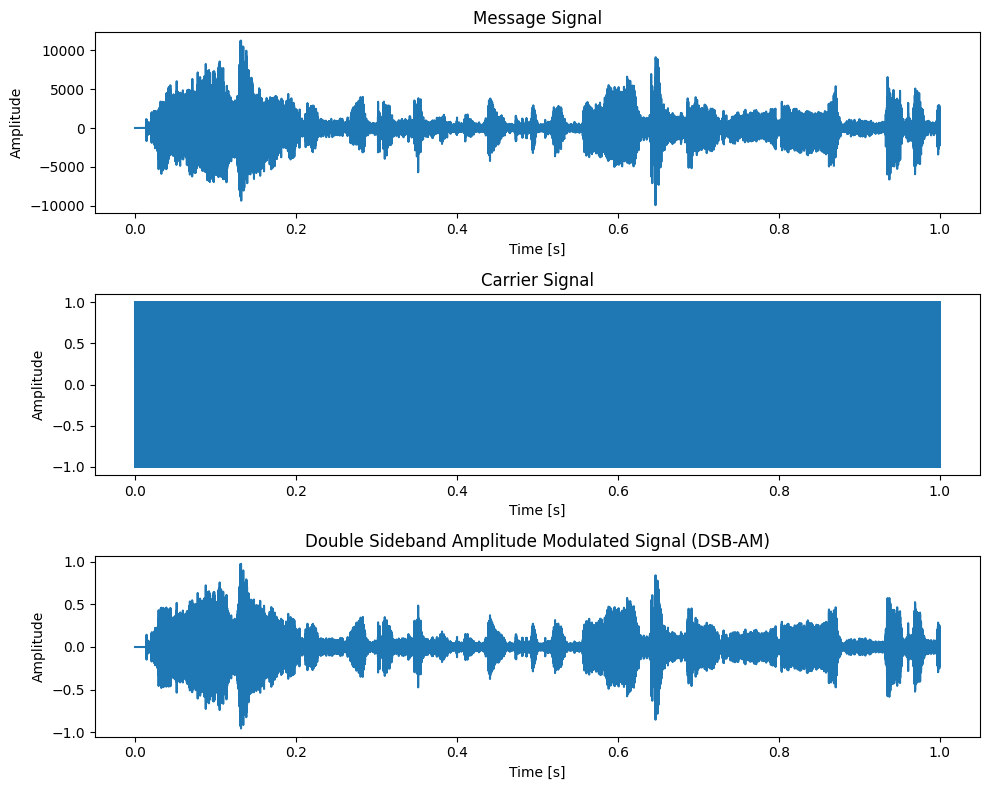

In [ ]:
# Modulación de los trozos
trozos_modulados = dsb_am_modulacion(audio_segments)

# Demodulación de los trozos
trozos_demodulados = dsb_am_demodulacion(trozos_modulados)

# Calcular el PSD de un trozo modulado
f, Pxx = calcular_psd(trozos_modulados[0])

# Reconstruir el audio completo
señal_reconstruida = reconstruir_audio(trozos_demodulados)

# Graficar los resultados
mensaje = np.array(audio_segments[0].get_array_of_samples())
portadora = np.cos(2 * np.pi * 10000 * np.linspace(0, 1, len(mensaje)))
graficar_modulacion_demodulacion(mensaje, portadora, trozos_modulados[0])

## PSD, Reconstrucción

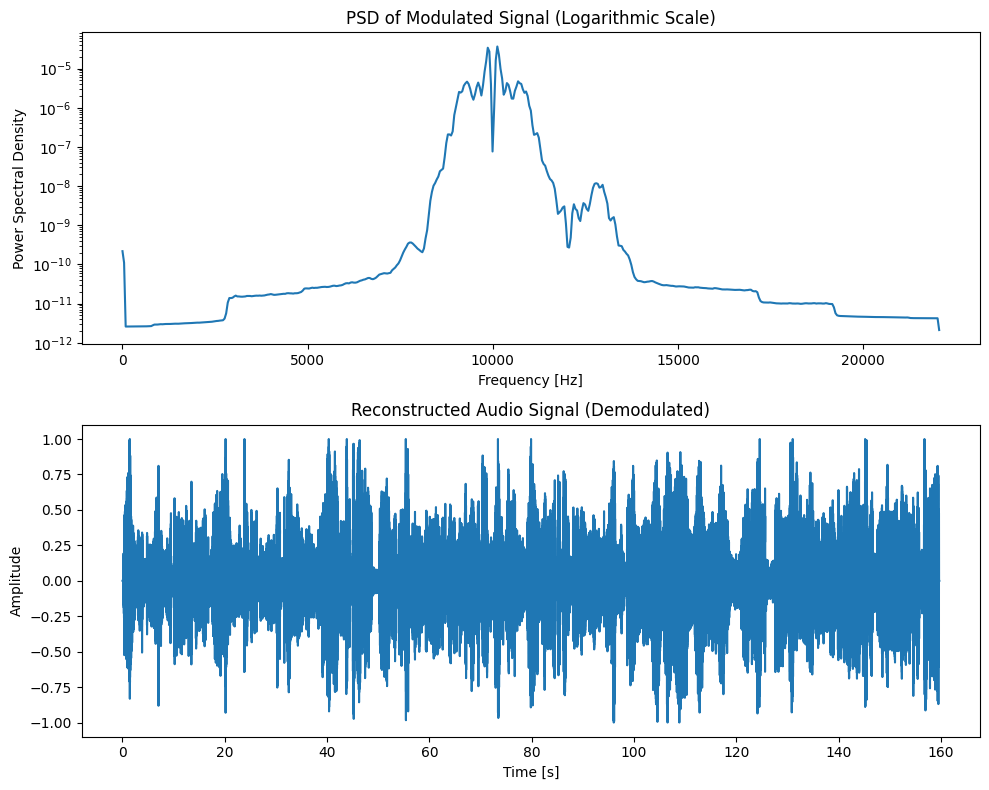

In [ ]:
# Reconstruir señal modulada y demodulada
señal_modulada = np.concatenate(trozos_modulados)  # Concatenar los trozos modulados
señal_demodulada = reconstruir_audio(trozos_demodulados)  # Reconstruir señal demodulada

# Graficar el PSD y la señal demodulada
graficar_psd_y_reconstruccion(señal_modulada,señal_demodulada)

## Reproducción Audios

In [ ]:
# Reproducir el audio original
archivo_audio = "radio.wav"  # Reemplaza con la ruta de tu archivo de audio
audio_original = reproducir_audio_original(archivo_audio)
display(audio_original)